In [1]:
import os
from sqlalchemy import create_engine, text
from dotenv import load_dotenv

import pandas as pd
import numpy as np

import plotly.graph_objects as go
from plotly.subplots import make_subplots

from tqdm import tqdm

import warnings
warnings.filterwarnings('ignore')

# Built-in function

In [2]:
from typing import List, Union
from scipy.stats import rankdata

def cumulative_percentile(
    series: pd.Series,
    rolling_window: Union[int, float] = 1e10,
    show_progress: bool = True
) -> pd.Series:
    """
    Computes the cumulative percentile of each value in a time series,
    optionally within a rolling window.

    Parameters
    ----------
    series : pd.Series
        The input time series.
    rolling_window : int or float, optional
        Number of past values to consider (including current). If large (default=1e10),
        computes percentiles over the entire history up to each point.
    show_progress : bool, optional
        Whether to show a tqdm progress bar.

    Returns
    -------
    pd.Series
        A series of percentiles (0–100) for each value, aligned with the original index.
    """
    percentiles = []
    iterator = tqdm(range(len(series))) if show_progress else range(len(series))

    for i in iterator:
        # Define the rolling window range
        start = max(0, int(i - rolling_window))
        current_values = series[start:i + 1].dropna()

        # Handle edge cases
        if len(current_values) == 0 or np.isnan(series.values[i]):
            percentiles.append(np.nan)
            continue

        # Rank the current values
        ranks = rankdata(current_values)
        percentile = (ranks[-1] - 1) / (len(current_values) - 1) * 100
        percentiles.append(percentile)

    return pd.Series(percentiles, index=series.index)

# <br><br> 1. Download data and preprocess

1. **Connect to Postgres**  
   Loads credentials from `.env` and creates a SQLAlchemy engine.

2. **Sanity check tables**  
   Prints schema (columns & types) and row counts for  
   `market_metrics`, `daily_summaries`, and `individual_trades`.

3. **Load dataframes**  
   Reads the three tables into pandas DataFrames.

4. **Normalize dates**  
   Converts time fields to `datetime` and creates a common `date` column.

5. **Reshape metrics (long → wide)**  
   Pivots `market_metrics` so each `metric_name` becomes its own column, aligned by `date`.

6. **Plot all metrics**  
   Uses Plotly to visualize each metric over time.

7. **Clean & refine**  
   Removes unwanted metrics, fixes outliers in `GEX_aggregate_bn` (replaced with `NaN` + interpolated), and replots.

8. **Shortlist for review**  
   Defines `for_review` with selected metrics for deeper inspection.


In [3]:
load_dotenv()
HOST = os.getenv("PG_HOST")
DB   = os.getenv("PG_DB")
USER = os.getenv("PG_USER")
PWD  = os.getenv("PG_PASSWORD")

engine = create_engine(f"postgresql+psycopg2://{USER}:{PWD}@{HOST}/{DB}")

# 1) sanity: peek schema & counts
datasets = [
    'market_metrics',
    'daily_summaries',
    'individual_trades'
]
for t in datasets:
    cols = pd.read_sql(f"""
        SELECT column_name, data_type
        FROM information_schema.columns
        WHERE table_name = '{t}'
        ORDER BY ordinal_position
    """, engine)
    
    cnt  = pd.read_sql(f"SELECT COUNT(*) AS n FROM {t};", engine)
    
    print(f"\n=== {t} ===\n", cols, "\nrows:", int(cnt['n'][0]))


=== market_metrics ===
     column_name                 data_type
0     timestamp  timestamp with time zone
1   metric_name         character varying
2  metric_value                   numeric
3     data_type         character varying
4        source         character varying
5    created_at  timestamp with time zone 
rows: 46451

=== daily_summaries ===
   column_name data_type
0        date      date
1      trades   integer
2        wins   integer
3     avg_win   numeric
4     win_pct   numeric
5      losses   integer
6    avg_loss   numeric
7    loss_pct   numeric
8   total_pnl   numeric
9  trade_date      date 
rows: 1085

=== individual_trades ===
     column_name                    data_type
0       type_in            character varying
1   datetime_in     timestamp with time zone
2      price_in                      numeric
3     contracts                      integer
4     price_out                      numeric
5   profit_loss                      numeric
6    trade_date        

In [4]:
# 2) pull full tables (2020-01-01 onward)

# market_metrics - All pre-market indicators (40+ metrics collected at 8:30 AM)
# daily_summaries - Daily trade outcomes (P&L, trade count, win rate)
# individual_trades - Detailed trade-by-trade data

with engine.connect() as conn:
    market_metrics = pd.read_sql(text("SELECT * FROM market_metrics;"), conn)
    daily_summaries = pd.read_sql(text("SELECT * FROM daily_summaries;"), conn)
    individual_trades = pd.read_sql(text("SELECT * FROM individual_trades;"), conn)

# Convert to datetime column
market_metrics["timestamp"] = pd.to_datetime(market_metrics["timestamp"])
daily_summaries["date"] = pd.to_datetime(daily_summaries["date"])
daily_summaries["trade_date"] = pd.to_datetime(daily_summaries["trade_date"])
individual_trades["datetime_in"] = pd.to_datetime(individual_trades["datetime_in"])
individual_trades["datetime_out"] = pd.to_datetime(individual_trades["datetime_out"])
individual_trades["trade_date"] = pd.to_datetime(individual_trades["trade_date"])

# Common date column to merge later...
market_metrics['date'] = market_metrics['timestamp'].dt.date
daily_summaries['date'] = daily_summaries['date'].dt.date
individual_trades['date'] = individual_trades['trade_date'].dt.date

market_metrics

,timestamp,metric_name,metric_value,data_type,source,created_at,date
0,2020-09-04 12:30:00+00:00,Charm_aggregate_bn,-0.122202,premarket,orats,2025-09-10 22:46:51.455271+00:00,2020-09-04
1,2020-09-03 12:30:00+00:00,Charm_aggregate_bn,-0.004954,premarket,orats,2025-09-10 22:46:51.455271+00:00,2020-09-03
2,2020-09-02 12:30:00+00:00,Charm_aggregate_bn,-0.011030,premarket,orats,2025-09-10 22:46:51.455271+00:00,2020-09-02
3,2020-09-01 12:30:00+00:00,Charm_aggregate_bn,0.003258,premarket,orats,2025-09-10 22:46:51.455271+00:00,2020-09-01
4,2020-09-04 12:30:00+00:00,DIX,0.359818,premarket,squeezemetrics,2025-09-10 22:46:51.455271+00:00,2020-09-04
...,...,...,...,...,...,...,...
46446,2025-09-11 12:30:00+00:00,IV_skew_25d_put_minus_call,0.229378,premarket,orats,2025-09-12 12:30:19.082374+00:00,2025-09-11
46447,2025-09-11 12:30:00+00:00,Vanna_aggregate_bn,-44.947701,premarket,orats,2025-09-12 12:30:19.082374+00:00,2025-09-11
46448,2025-09-11 12:30:00+00:00,Charm_aggregate_bn,0.000586,premarket,orats,2025-09-12 12:30:19.082374+00:00,2025-09-11
46449,2025-09-11 12:30:00+00:00,Options_volume_vs_20d_avg,0.836616,premarket,orats,2025-09-12 12:30:19.082374+00:00,2025-09-11


In [5]:
# --- Generate dataframe with all market metrics, organized in columns ---
market_metrics_in_columns = daily_summaries[['date']]

market_metrics_names = np.unique(market_metrics['metric_name'].values)
for market_metric in tqdm(market_metrics_names):
    market_metrics_filt = market_metrics[market_metrics['metric_name'] == market_metric][['date', 'metric_value']]
    market_metrics_filt[market_metric] = market_metrics_filt['metric_value']
    market_metrics_filt = market_metrics_filt[['date', market_metric]]

    market_metrics_in_columns = market_metrics_in_columns.merge(market_metrics_filt, on='date', how='left')

market_metrics_in_columns.sort_values(by="date", ascending=True, inplace=True)

# --- Plot all market metrics ---
for market_metric in market_metrics_names:
    fig = go.Figure()
    fig.add_trace(go.Scatter(x=market_metrics_in_columns.date, y=market_metrics_in_columns[market_metric]))
    fig.update_layout(width=1000, height=400, title=market_metric)
    fig.show()

100%|██████████████████████████████████████████████████████████████████████████████████| 37/37 [00:00<00:00, 79.67it/s]


In [6]:
# Remove useless signals
discarded_metrics = [
    'FOMC_Minutes',
    'FOMC_Rate',
]
market_metrics_names = [mm for mm in market_metrics_names if not mm in discarded_metrics]

# Remove outliers from GEX_aggregate_bn
outlier_1 = np.max(market_metrics_in_columns['GEX_aggregate_bn'])
outlier_2 = np.min(market_metrics_in_columns['GEX_aggregate_bn'])
mask_1 = market_metrics_in_columns['GEX_aggregate_bn'] == outlier_1
mask_2 = market_metrics_in_columns['GEX_aggregate_bn'] == outlier_2
market_metrics_in_columns.loc[mask_1 | mask_2, 'GEX_aggregate_bn'] = np.nan
market_metrics_in_columns['GEX_aggregate_bn'] = market_metrics_in_columns['GEX_aggregate_bn'].interpolate()

# --- Plot all market metrics ---
for market_metric in market_metrics_names:
    fig = go.Figure()
    fig.add_trace(go.Scatter(x=market_metrics_in_columns.date, y=market_metrics_in_columns[market_metric]))
    fig.update_layout(width=1000, height=400, title=market_metric)
    fig.show()

In [7]:
for_review = [
    'Gamma_resistance_level',
    'Gamma_support_level',
    'IV_skew_25d_put_minus_call',
    'Options_0DTE_volume_pct',
    'Options_total_volume'
]

# <br><br> 2. EDA, daily summaries

1. **Histogram of trades**  
   Plots the distribution of daily number of trades.

2. **Win rate vs. trades**  
   - Computes median and mean `win_pct` for each possible number of trades.  
   - Plots raw datapoints, medians, and means together.

3. **PnL vs. trades**  
   - Same as above but using `total_pnl`.  
   - Shows relationship between trade count and profitability.

4. **Win rate split (<4 vs ≥4 trades)**  
   - Splits dataset into two groups (`<4` and `≥4` trades).  
   - Computes overall win rate for each group.

5. **Total PnL vs. trades**  
   - Aggregates `total_pnl` by number of trades.  
   - Visualizes total profitability per trade count.

6. **Grouped version (collapse >4)**  
   - Collapses all cases with more than 4 trades into a single category `">4"`.  
   - Plots total PnL by trade count, including grouped category.


In [8]:
y, x = np.histogram(daily_summaries['trades'], bins=50)

fig = go.Figure()
fig.add_trace(go.Bar(x=x[1:], y=y))
fig.update_layout(width=1000, height=500, xaxis_title='N trades', yaxis_title='Count')

In [9]:
# First, lets explore correlation between number of trades, win rate, etc.

# --- Calculate median, mean of win_pct vs n_trades ---
n_trades_possible = np.unique(daily_summaries['trades'].values)

results = {
    'n_trades': [],
    'median': [],
    'mean': []
}
for n_trades in n_trades_possible:
    median_ = daily_summaries[daily_summaries['trades'] == n_trades]['win_pct'].median()
    mean_ = daily_summaries[daily_summaries['trades'] == n_trades]['win_pct'].mean()

    results['n_trades'].append(n_trades)
    results['median'].append(median_)
    results['mean'].append(mean_)

# --- Plot ---
fig = go.Figure()
fig.add_trace(go.Scatter(x=daily_summaries['trades'], y=daily_summaries['win_pct'], mode='markers', name='Datapoints'))
fig.add_trace(go.Scatter(x=results['n_trades'], y=results['median'], name='Median'))
fig.add_trace(go.Scatter(x=results['n_trades'], y=results['mean'], name='Mean'))
fig.update_layout(width=1000, height=500, xaxis_title='N trades', yaxis_title='Win pct [%]')

In [10]:
# Repeat for PnL

# --- Calculate median, mean of win_pct vs n_trades ---
n_trades_possible = np.unique(daily_summaries['trades'].values)

results = {
    'n_trades': [],
    'median': [],
    'mean': []
}
for n_trades in n_trades_possible:
    median_ = daily_summaries[daily_summaries['trades'] == n_trades]['total_pnl'].median()
    mean_ = daily_summaries[daily_summaries['trades'] == n_trades]['total_pnl'].mean()

    results['n_trades'].append(n_trades)
    results['median'].append(median_)
    results['mean'].append(mean_)

# --- Plot ---
fig = go.Figure()
fig.add_trace(go.Scatter(x=daily_summaries['trades'], y=daily_summaries['total_pnl'], mode='markers', name='Datapoints'))
fig.add_trace(go.Scatter(x=results['n_trades'], y=results['median'], name='Median'))
fig.add_trace(go.Scatter(x=results['n_trades'], y=results['mean'], name='Mean'))
fig.update_layout(width=1000, height=500, xaxis_title='N trades', yaxis_title='PnL [$]')

In [11]:
daily_summaries_1 = daily_summaries[daily_summaries['trades'] < 4]
wins_1, losses_1 = daily_summaries_1['wins'].sum(), daily_summaries_1['losses'].sum()

daily_summaries_2 = daily_summaries[daily_summaries['trades'] >= 4]
wins_2, losses_2 = daily_summaries_2['wins'].sum(), daily_summaries_2['losses'].sum()

print('Win rate')
print('---------------------------------')
print(f'N trades < 4:       {round(100*wins_1/(wins_1 + losses_1), 2)} %')
print(f'N trades >= 4:      {round(100*wins_2/(wins_2 + losses_2), 2)} %')

Win rate
---------------------------------
N trades < 4:       54.79 %
N trades >= 4:      17.73 %


In [12]:
# --- Let's see total PnL vs number of trades ---
n_trades_possible = np.unique(daily_summaries['trades'].values)

results = {
    'n_trades': [],
    'total_pnl': []
}
for n_trades in n_trades_possible:
    sum_ = daily_summaries[daily_summaries['trades'] == n_trades]['total_pnl'].sum()

    results['n_trades'].append(n_trades)
    results['total_pnl'].append(sum_)

# --- Plot ---
fig = go.Figure()
fig.add_trace(go.Bar(x=results['n_trades'], y=results['total_pnl'], name='Total PnL'))
fig.update_layout(width=1000, height=500, xaxis_title='N trades', yaxis_title='PnL [$]')

In [13]:
# --- Same as previous, but group if >4 ---
n_trades_possible = np.unique(daily_summaries['trades'].values)

results = {
    'n_trades': [],
    'total_pnl': []
}

for n_trades in n_trades_possible:
    if n_trades == 5:
        sum_ = daily_summaries[daily_summaries['trades'] > 4]['total_pnl'].sum()

        results['n_trades'].append(">4")   # use string label instead of 5
        results['total_pnl'].append(sum_)
        break
    else:
        sum_ = daily_summaries[daily_summaries['trades'] == n_trades]['total_pnl'].sum()

        results['n_trades'].append(str(n_trades))   # keep consistency (all as strings)
        results['total_pnl'].append(sum_)

# --- Plot ---
fig = go.Figure()
fig.add_trace(go.Bar(x=results['n_trades'], y=results['total_pnl'], name='Total PnL'))
fig.update_layout(width=600, height=500, xaxis_title='N trades', yaxis_title='PnL [$]')
fig.show()

# <br><br> 3. EDA, individual trades

1. **Daily aggregation**  
   - Iterates over each trading day.  
   - For each day:  
     - Sorts trades chronologically.  
     - Records total number of trades, total PnL, and whether the *first trade* was profitable.  
   - Builds a DataFrame (`df`) with these daily stats.

2. **First trade outcome**  
   - Splits days into two groups: first trade profitable vs. first trade loss.  
   - Plots histograms of trade counts for each group.  
   - Compares total PnL between both cases.

3. **PnL by first profitable trade**  
   - For each day, identifies the order (1st, 2nd, …, 9th) of the first profitable trade.  
   - Uses `9` as a label when no profitable trade occurs.  
   - Plots scatter of daily PnL vs. that order.

4. **Aggregate PnL by first profitable trade**  
   - Groups by the order of first profitable trade.  
   - Sums PnL for each category (including “no profitable trade”).  
   - Plots total PnL distribution by first profitable trade index.


In [14]:
# --- Let's analyze individual trades ---
all_days = np.unique(individual_trades['date'].values)

results = {
    'n_trades': [],
    'pnl': [],
    'first_trade_profitable' : []
}
for day in tqdm(all_days):
    individual_trades_filt = individual_trades[individual_trades['date'] == day]
    individual_trades_filt.sort_values('datetime_in', ascending=True, inplace=True)

    n_trades = len(individual_trades_filt)
    pnl = individual_trades_filt['profit_loss'].sum()
    first_trade_profitable = individual_trades_filt['profit_loss'].values[0] > 0
    
    results['n_trades'].append(n_trades)
    results['pnl'].append(pnl)
    results['first_trade_profitable'].append(first_trade_profitable)

100%|█████████████████████████████████████████████████████████████████████████████| 1085/1085 [00:02<00:00, 537.94it/s]


In [15]:
df = pd.DataFrame(results)

first_trade_profit = df[df['first_trade_profitable']]
first_trade_loss = df[~df['first_trade_profitable']]

# --- Plot distribution ---
counts = first_trade_profit['n_trades'].value_counts().sort_index()

x = counts.index.values   # unique values of n_trades
y = counts.values         # frequency

fig = go.Figure()
fig.add_trace(go.Bar(x=x, y=y))
fig.update_layout(width=600, height=500, xaxis_title='N trades', yaxis_title='Count', title='Days with first trade in profit')

In [16]:
# --- Plot distribution ---
counts = first_trade_loss['n_trades'].value_counts().sort_index()

x = counts.index.values   # unique values of n_trades
y = counts.values         # frequency

fig = go.Figure()
fig.add_trace(go.Bar(x=x, y=y))
fig.update_layout(width=600, height=500, xaxis_title='N trades', yaxis_title='Count', title='Days with first trade in loss')

In [17]:
fp_sum = first_trade_profit['pnl'].sum()
fl_sum = first_trade_loss['pnl'].sum()


print('Total PnL $ from:')
print('------------------------------------------')
print(f'First trade hits TP: {int(fp_sum)/1000} k$')
print(f'First trade hits SL: {int(fl_sum)/1000} k$')

Total PnL $ from:
------------------------------------------
First trade hits TP: 509.09 k$
First trade hits SL: -229.199 k$


In [18]:
# --- Let's analyze N trade that first hits TP, vs PnL ---
# --- We want to spot the cascade pattern ---

all_days = np.unique(individual_trades['date'].values)

results = {
    'n_trades': [],
    'pnl': [],
    'n_trade_profitable' : []
}
for day in tqdm(all_days):
    individual_trades_filt = individual_trades[individual_trades['date'] == day]
    individual_trades_filt.sort_values('datetime_in', ascending=True, inplace=True)
    individual_trades_filt.index = range(len(individual_trades_filt))

    n_trades = len(individual_trades_filt)
    pnl = individual_trades_filt['profit_loss'].sum()

    # n_trade_profitable is the Number of trade that is profitable (first, second, third... or None)
    if len(individual_trades_filt[individual_trades_filt["profit_loss"] > 0]) == 0:
        n_trade_profitable = 9
    else:
        n_trade_profitable = individual_trades_filt[individual_trades_filt["profit_loss"] > 0].index[0] + 1
    
    results['n_trades'].append(n_trades)
    results['pnl'].append(pnl)
    results['n_trade_profitable'].append(n_trade_profitable)

100%|█████████████████████████████████████████████████████████████████████████████| 1085/1085 [00:03<00:00, 286.91it/s]


In [19]:
df = pd.DataFrame(results)

# Replace NaN with 9 for "no profitable trade"
df['n_trade_profitable'] = df['n_trade_profitable'].fillna(9)

fig = go.Figure()
fig.add_trace(go.Scatter(
    x=df.n_trade_profitable,
    y=df.pnl,
    mode='markers'
))

fig.update_layout(
    width=1000,
    height=500,
    xaxis_title='N trade that is profitable first',
    yaxis_title='PnL [$]',
    xaxis=dict(
        tickmode='array',
        tickvals=list(range(1, 10)),  # 1..9
        ticktext=[str(i) for i in range(1, 9)] + ["No profitable trade"]
    )
)

fig.show()

In [20]:
df = pd.DataFrame(results)

# Replace NaN with 9 for "no profitable trade"
df['n_trade_profitable'] = df['n_trade_profitable'].fillna(9)

# Group by n_trade_profitable and sum PnL
agg = df.groupby('n_trade_profitable', as_index=False)['pnl'].sum()

fig = go.Figure()
fig.add_trace(go.Bar(
    x=agg['n_trade_profitable'],
    y=agg['pnl']
))

fig.update_layout(
    width=1000,
    height=500,
    xaxis_title='N trade that is profitable first',
    yaxis_title='Total PnL [$]',
    xaxis=dict(
        tickmode='array',
        tickvals=list(range(1, 10)),  # 1..9
        ticktext=[str(i) for i in range(1, 9)] + ["No profitable trade"]
    )
)

fig.show()

# <br><br> 4. EDA, features predictive power

1. **Preprocessing**  
   - Removes discarded and review-only metrics.  
   - Keeps remaining features in `market_metrics_df`.  
   - Converts each feature into a *quintile score* (1–5), computed without data leakage.  
   - Plots raw signals vs. quintiles over time.

2. **Merge with trades data**  
   - Joins market metrics with `daily_summaries` (trades, PnL, wins, losses) on `date`.  
   - Splits into train/test sets for correlation analysis.

3. **Correlation analysis**  
   - Computes Spearman correlations between each metric and `total_pnl`.  
   - Sorts metrics by absolute correlation.  
   - Visualizes average PnL across feature quintiles for each metric.  
   - Builds a feature correlation heatmap (all metrics).

4. **Focus on selected features**  
   - Narrows down to a small set of “best metrics”.  
   - Computes correlation matrix and plots detailed heatmap.

5. **Composite quintile signal**  
   - Combines best metrics into a composite quintile score.  
   - Normalizes again and evaluates Spearman correlation vs. `total_pnl`.  
   - Plots average PnL by composite quintile.  
   - Repeats the same analysis but with **number of trades** as the outcome variable.

**Goal:** Identify which signals, individually or in combination, show predictive power over trading outcomes (PnL and number of trades). We might be able to build a simple model (e.g. dont trade if a*X + b*Y > threshold) which improves trading results enough.

In [21]:
# --- First, merge market_metrics, with trades data ---

# Remove some columns...
discarded_metrics = [
    'FOMC_Minutes',
    'FOMC_Rate',
]

for_review = [
    'Gamma_resistance_level',
    'Gamma_support_level',
    'IV_skew_25d_put_minus_call',
    'Options_0DTE_volume_pct',
    'Options_total_volume'
]

used_metrics = [k for k in market_metrics_in_columns.keys() if not k == 'date' and not k in discarded_metrics and not k in for_review]
market_metrics_df = market_metrics_in_columns.drop(columns=discarded_metrics+for_review)

# Convert feature to decile
for k in tqdm(market_metrics_df.keys()):
    if k == 'date':
        continue

    # Convert metric to Quintile (1,2,3,4 or 5)... This is for normalization, so signal is compared to past values (1 low - 5 high)
    # We only use past data for the conversion, so there is no data-leakage
    market_metrics_df[f'{k}_quintile'] = (cumulative_percentile(market_metrics_df[k], 1e10, False) // 20 + 1).clip(1,5)

# Weekday idx doesnt need any conversiont
market_metrics_df['Weekday_idx_quintile'] = market_metrics_df['Weekday_idx']

100%|██████████████████████████████████████████████████████████████████████████████████| 31/31 [00:15<00:00,  2.00it/s]


In [22]:
# --- Plot raw signals and quintiles ---
for k in market_metrics_df.keys():
    if k == 'date' or 'quintile' in k:
        continue
    
    fig = make_subplots(rows=1, cols=1, specs=[[{'secondary_y':True}]])
    fig.add_trace(go.Scatter(x=market_metrics_df.date, y=market_metrics_df[k], name='Raaw signal'))
    fig.add_trace(go.Scatter(x=market_metrics_df.date, y=market_metrics_df[f'{k}_quintile'], name='Quintile'), secondary_y=True)
    fig.update_layout(title=k)
    fig.show()

In [23]:
# --- Check avg. number of trades by feature quintile ---

# --- First, we need to merge market_metrics with trades dataset ---
data = pd.merge(market_metrics_df, daily_summaries[['date', 'trades', 'total_pnl', 'wins', 'losses']], on='date', how='inner')

# --- Split Train/Test to avoid data lekeage ---
n_train = int(0.5*len(data))
train_data, test_data = data.iloc[:n_train], data.iloc[n_train:]

# --- Calculate spearman corr for all features ---
used_metrics_corr = []
for metric in used_metrics:
    corr = train_data[metric].corr(train_data["total_pnl"], method="spearman")
    used_metrics_corr.append(corr)

df = pd.DataFrame({
    'metric': used_metrics,
    'corr': used_metrics_corr,
    'corr_abs': np.abs(used_metrics_corr),
})
df.sort_values('corr_abs', ascending=False, inplace=True)

used_metrics_sorted = df['metric'].values

# --- Plot avg. number of trades vs feature quintile ---
subplot_titles = [f'{metric}: {round(corr, 2)}' for metric, corr in zip(df['metric'].values, df['corr'].values)]
fig = make_subplots(rows=6, cols=5, subplot_titles=subplot_titles)

for cont, metric in enumerate(used_metrics_sorted):
    col_id = cont % 5 + 1
    row_id = cont // 5 + 1
    
    results = {
        'quintile': [],
        'mean': [],
        'median': [],
    }
    for quintile in range(1,6):
        data_filt = train_data[train_data[f'{metric}_quintile'] == quintile]
    
        mean_ = data_filt['total_pnl'].mean()
        median_ = data_filt['total_pnl'].median()
    
        results['quintile'].append(quintile)
        results['mean'].append(mean_)
        results['median'].append(median_)
    
    fig.add_trace(go.Bar(x=results['quintile'], y=results['mean'], showlegend=False, marker_color="steelblue"), row=row_id, col=col_id)

fig.update_layout(
    width=1100,
    height=1000,
    title='Metric quintile vs Total PnL (sorted by spearman corr)',
    annotations=[
        dict(
            text=ann.text,
            x=ann.x,
            y=ann.y,
            xref=ann.xref,
            yref=ann.yref,
            showarrow=False,
            font=dict(size=12)   # <-- adjust this value
        )
        for ann in fig.layout.annotations
    ]
)
fig.show()

In [24]:
import plotly.express as px

# --- Correlation between features ---
corr = train_data[used_metrics].corr(method="spearman")

# --- Plot heatmap ----
fig = px.imshow(
    corr,
    x=corr.columns,
    y=corr.columns,
    color_continuous_scale="RdBu",
    zmin=-1, zmax=1,
)
fig.update_layout(
    width=800,
    height=800,
    title="Feature Correlation Matrix"
)
fig.show()

In [25]:
import plotly.express as px

best_metrics = [
    'PDC_ATR_Delta',
    'Options_volume_vs_20d_avg',
    'PDC_VOL_20MA',
    'NQ_overnight_gap_pct',
]

# --- Correlation between chosen metrics ---
corr = train_data[best_metrics].corr(method="spearman")

# Plot heatmap
fig = px.imshow(
    corr,
    x=corr.columns,
    y=corr.columns,
    color_continuous_scale="RdBu",
    zmin=-1, zmax=1,
    text_auto=".2f"   # show numbers with 2 decimals
)
fig.update_layout(
    width=800,
    height=800,
    title="Feature Correlation Matrix (selected features)"
)
fig.show()

In [26]:
train_data['composite_quintile'] = train_data[[f'{metric}_quintile' for metric in best_metrics]].mean(axis=1)

# --- Normalize again, as signals has some correlation between them, and we are interested in quintile ---
train_data['composite_quintile'] = (cumulative_percentile(train_data['composite_quintile'], 1e10, False) // 20 + 1).clip(1,5)

corr = train_data['composite_quintile'].corr(train_data["total_pnl"], method="spearman")

 # --- Calculate mean and median for different quintiles ---
results = {
    'quintile': [],
    'mean': [],
    'median': [],
}
for quintile in range(1,6):
    data_filt = train_data[train_data['composite_quintile'] == quintile]

    mean_ = data_filt['total_pnl'].mean()
    median_ = data_filt['total_pnl'].median()

    results['quintile'].append(quintile)
    results['mean'].append(mean_)
    results['median'].append(median_)

# --- Plot ---
fig = go.Figure()
fig.add_trace(go.Bar(x=results['quintile'], y=results['mean'], showlegend=False, marker_color="steelblue"))
fig.update_layout(
    width=800,
    height=800,
    xaxis_title='Composite quintile',
    yaxis_title='Avg. PnL [$]',
    title=f'In-Sample data, corr: {round(corr, 2)}'
)

In [27]:
train_data['composite_quintile'] = train_data[[f'{metric}_quintile' for metric in best_metrics]].mean(axis=1)

# --- Normalize again, as signals has some correlation between them, and we are interested in quintile ---
train_data['composite_quintile'] = (cumulative_percentile(train_data['composite_quintile'], 1e10, False) // 20 + 1).clip(1,5)

corr = train_data['composite_quintile'].corr(train_data["trades"], method="spearman")

 # --- Calculate mean and median for different quintiles ---
results = {
    'quintile': [],
    'mean': [],
    'median': [],
}
for quintile in range(1,6):
    data_filt = train_data[train_data['composite_quintile'] == quintile]

    mean_ = data_filt['trades'].mean()
    median_ = data_filt['trades'].median()

    results['quintile'].append(quintile)
    results['mean'].append(mean_)
    results['median'].append(median_)

# --- Plot ---
fig = go.Figure()
fig.add_trace(go.Bar(x=results['quintile'], y=results['mean'], showlegend=False, marker_color="steelblue"))
fig.update_layout(
    width=800,
    height=800,
    xaxis_title='Composite quintile',
    yaxis_title='Avg. number of trades',
    title=f'In-Sample data, corr: {round(corr, 2)}'
)

# <br> 5.Out-Of-Sample validation

1. **Composite quintile (OOS)**  
   - Builds composite quintile in `test_data` from selected best metrics.  
   - Normalizes again to avoid correlation effects.  
   - Evaluates Spearman correlation with both **PnL** and **number of trades**.  
   - Plots average PnL and average trades per quintile.

2. **PnL filtering strategy**  
   - Splits days into “do trade” (quintile > 1) and “don’t trade” (quintile = 1).  
   - Compares total PnL for both groups in **in-sample** (IS) and **out-of-sample** (OOS) data.  
   - Shows how skipping the lowest-quintile days affects profitability.

3. **Accuracy & precision metrics**  
   - Defines `compute_metrics` to calculate:  
     - **Accuracy (hit rate):** correctly trading or skipping.  
     - **Trade precision:** fraction of profitable trades when chosen to trade.  
     - **Skip precision:** fraction of avoided losing days when skipping.  
   - Reports these metrics for both Train and Test sets in a summary table.

In [28]:
test_data['composite_quintile'] = test_data[[f'{metric}_quintile' for metric in best_metrics]].mean(axis=1)

# Normalize again, as features are not 100% independent, there are correlated between them
test_data['composite_quintile'] = (cumulative_percentile(test_data['composite_quintile'], 1e10, False) // 20 + 1).clip(1,5)

corr = test_data['composite_quintile'].corr(test_data["total_pnl"], method="spearman")

results = {
    'quintile': [],
    'mean': [],
    'median': [],
}
for quintile in range(1,6):
    data_filt = test_data[test_data['composite_quintile'] == quintile]

    mean_ = data_filt['total_pnl'].mean()
    median_ = data_filt['total_pnl'].median()

    results['quintile'].append(quintile)
    results['mean'].append(mean_)
    results['median'].append(median_)

fig = go.Figure()
fig.add_trace(go.Bar(x=results['quintile'], y=results['mean'], showlegend=False, marker_color="steelblue"))
fig.update_layout(
    width=800,
    height=800,
    xaxis_title='Composite quintile',
    yaxis_title='Avg. PnL [$]',
    title=f'Out-Of-Sample data, corr: {round(corr, 2)}'
)

In [29]:
test_data['composite_quintile'] = test_data[[f'{metric}_quintile' for metric in best_metrics]].mean(axis=1)

# Normalize again, as features are not 100% independent, there are correlated between them
test_data['composite_quintile'] = (cumulative_percentile(test_data['composite_quintile'], 1e10, False) // 20 + 1).clip(1,5)

corr = test_data['composite_quintile'].corr(test_data["trades"], method="spearman")

results = {
    'quintile': [],
    'mean': [],
    'median': [],
}
for quintile in range(1,6):
    data_filt = test_data[test_data['composite_quintile'] == quintile]

    mean_ = data_filt['trades'].mean()
    median_ = data_filt['trades'].median()

    results['quintile'].append(quintile)
    results['mean'].append(mean_)
    results['median'].append(median_)

fig = go.Figure()
fig.add_trace(go.Bar(x=results['quintile'], y=results['mean'], showlegend=False, marker_color="steelblue"))
fig.update_layout(
    width=800,
    height=800,
    xaxis_title='Composite quintile',
    yaxis_title='Avg. number of trades',
    title=f'Out-Of-Sample data, corr: {round(corr, 2)}'
)

In [30]:
# --- Let's see strategy PnL on Out-Of-Sample data, filtering days when composite signal is low ---

# We are NOT trading 20% of days (when composite quintile is 1)
train_data_dont_trade = train_data[train_data['composite_quintile'] == 1]
train_data_do_trade = train_data[train_data['composite_quintile'] > 1]

test_data_dont_trade = test_data[test_data['composite_quintile'] == 1]
test_data_do_trade = test_data[test_data['composite_quintile'] > 1]

test_dont_trade_pnl = test_data_dont_trade['total_pnl'].sum()
test_do_trade_pnl = test_data_do_trade['total_pnl'].sum()
train_dont_trade_pnl = train_data_dont_trade['total_pnl'].sum()
train_do_trade_pnl = train_data_do_trade['total_pnl'].sum()

print('OOS data')
print('--------------------------------------------------------')
print(f'Total PnL on days we are NOT trading:     {int(test_dont_trade_pnl/1000)} k$')
print(f'Total PnL on days we are trading:         {int(test_do_trade_pnl/1000)} k$')

print('\nIS data')
print('--------------------------------------------------------')
print(f'Total PnL on days we are NOT trading:     {int(train_dont_trade_pnl/1000)} k$')
print(f'Total PnL on days we are trading:         {int(train_do_trade_pnl/1000)} k$')

OOS data
--------------------------------------------------------
Total PnL on days we are NOT trading:     -30 k$
Total PnL on days we are trading:         173 k$

IS data
--------------------------------------------------------
Total PnL on days we are NOT trading:     -53 k$
Total PnL on days we are trading:         190 k$


In [31]:
# --- Compute accuracy for both Train and Test ---

def compute_metrics(do_trade, dont_trade):
    do_wins, do_losses = do_trade['wins'].sum(), do_trade['losses'].sum()
    dont_wins, dont_losses = dont_trade['wins'].sum(), dont_trade['losses'].sum()
    
    # Overall accuracy (hit rate)
    correct = do_wins + dont_losses
    total   = do_wins + do_losses + dont_wins + dont_losses
    accuracy = correct / total if total > 0 else None
    
    # Trade precision
    trade_total = do_wins + do_losses
    trade_precision = do_wins / trade_total if trade_total > 0 else None
    
    # Skip precision
    skip_total = dont_wins + dont_losses
    skip_precision = dont_losses / skip_total if skip_total > 0 else None
    
    return accuracy, trade_precision, skip_precision

# Compute for Train
train_acc, train_trade_prec, train_skip_prec = compute_metrics(train_data_do_trade, train_data_dont_trade)

# Compute for Test
test_acc, test_trade_prec, test_skip_prec = compute_metrics(test_data_do_trade, test_data_dont_trade)

# Put in a summary table
df_results = pd.DataFrame({
    "Dataset": ["Train", "Test"],
    "Accuracy (Hit Rate)": [train_acc, test_acc],
    "Trade Precision": [train_trade_prec, test_trade_prec],
    "Skip Precision": [train_skip_prec, test_skip_prec]
})

print(df_results)

  Dataset  Accuracy (Hit Rate)  Trade Precision  Skip Precision
0   Train             0.369734         0.263697        0.790650
1    Test             0.385370         0.257313        0.778702


# <br><br> 6. Some analytics on DON'T TRADE DAYS

1. **Histograms by trades & PnL**  
   - Compares distribution of number of trades for “don’t trade” vs. “do trade” days.  
   - Plots histograms of total daily PnL for both groups, normalized to distributions.

2. **First trade profitability check**  
   - For each date, checks whether the **first trade** was profitable.  
   - Calculates the percentage of days with first trade in profit separately for “don’t trade” vs. “do trade” groups.

3. **Key output**  
   - Provides side-by-side statistics to see if skipping days (quintile = 1) correlates with a different pattern of first-trade outcomes compared to trading days.

In [32]:
# --- Histogram of days that we don't trade, and days that we trade ---

test_data_dont_trade_histogram = test_data_dont_trade.groupby('trades', as_index=False).size()
test_data_do_trade_histogram = test_data_do_trade.groupby('trades', as_index=False).size()

fig = go.Figure()

fig.add_trace(go.Bar(x=test_data_dont_trade_histogram['trades'], 
                     y=test_data_dont_trade_histogram['size']/test_data_dont_trade_histogram['size'].sum(), name="Don't trade", opacity=0.5))
fig.add_trace(go.Bar(x=test_data_do_trade_histogram['trades'], 
                     y=test_data_do_trade_histogram['size']/test_data_do_trade_histogram['size'].sum(), name="Do trade", opacity=0.5))

fig.update_layout(width=1000, height=500, yaxis_title='Distribution', xaxis_title='N trades')

In [33]:
# --- Histogram of days that we don't trade, and days that we trade ---

y_1, x_1 = np.histogram(test_data_dont_trade['total_pnl'], bins=20)
y_2, x_2 = np.histogram(test_data_do_trade['total_pnl'], bins=20)

fig = go.Figure()

fig.add_trace(go.Bar(x=x_1[1:], y=y_1/sum(y_1), opacity=0.5, name="Don't trade"))
fig.add_trace(go.Bar(x=x_2[1:], y=y_2/sum(y_2), opacity=0.5, name="Do trade"))

fig.update_layout(width=1000, height=500, yaxis_title='Distribution', xaxis_title='Total PnL [$]', barmode='overlay')

In [34]:
## --- Check now many SKIP days have 1st trade profitable ---
first_trade_profitable = []
for dt in test_data_dont_trade['date'].values:
    trades = individual_trades[individual_trades['date'] == dt]
    
    if len(trades) == 0:
        first_trade_profitable.append(np.nan)
        continue
    
    first_trade_profitable.append(trades['profit_loss'].values[0] > 0)

test_data_dont_trade['first_trade_profitable'] = first_trade_profitable
dont_trade_ftp_pct = test_data_dont_trade['first_trade_profitable'].astype(int).sum() / len(test_data_dont_trade)

# --- Repeat same exercise for test_data_do_Trade ---
first_trade_profitable = []
for dt in test_data_do_trade['date'].values:
    trades = individual_trades[individual_trades['date'] == dt]
    
    if len(trades) == 0:
        first_trade_profitable.append(np.nan)
        continue
    
    first_trade_profitable.append(trades['profit_loss'].values[0] > 0)

test_data_do_trade['first_trade_profitable'] = first_trade_profitable
do_trade_ftp_pct = test_data_do_trade['first_trade_profitable'].astype(int).sum() / len(test_data_do_trade)

print('Percentage of days with first trade profitable')
print('---------------------------------------------------')
print(f"Don't trade dates:    {round(100*dont_trade_ftp_pct, 1)} %")
print(f"Do trade dates:       {round(100*do_trade_ftp_pct, 1)} %")

Percentage of days with first trade profitable
---------------------------------------------------
Don't trade dates:    17.5 %
Do trade dates:       26.8 %


# <br><br> 7. Equity curve

1. **Equity curves**  
   - Builds cumulative PnL (`equity`) for both train and test sets.  
   - Applies a filter (`composite_quintile > 1`) to compute an alternative equity curve where low-signal days are skipped.  
   - Plots equity vs. equity_filtered to visualize effect of filtering.

2. **Performance stats (Train)**  
   - Computes annualized return, volatility, maximum drawdown, Sharpe ratio, and Calmar ratio.  
   - Compares metrics for original equity vs. filtered equity (trading only on higher-signal days).

3. **Performance stats (Test)**  
   - Repeats the same calculations for the out-of-sample period.  
   - Compares unfiltered vs. filtered performance to check robustness.

**Goal:** Evaluate whether filtering trades using the composite quintile improves equity growth, risk-adjusted returns, and drawdowns both in-sample and out-of-sample.

In [35]:
# --- Equity curve on Train data ---
train_data['equity'] = train_data['total_pnl'].cumsum()

mask = train_data['composite_quintile'] > 1
train_data['equity_filtered'] = (train_data['total_pnl'] * mask.astype(int)).cumsum()

# --- Equity curve on Test data ---
test_data['equity'] = test_data['total_pnl'].cumsum()

mask = test_data['composite_quintile'] > 1
test_data['equity_filtered'] = (test_data['total_pnl'] * mask.astype(int)).cumsum()

# --- plot ---
fig = go.Figure()

# fig.add_trace(go.Scatter(x=train_data.date, y=train_data.equity, name='Equity, TRAIN'))
# fig.add_trace(go.Scatter(x=train_data.date, y=train_data.equity_filtered, name='Equity filtered, TRAIN'))
fig.add_trace(go.Scatter(x=test_data.date, y=test_data.equity, name='Equity, TEST'))
fig.add_trace(go.Scatter(x=test_data.date, y=test_data.equity_filtered, name='Equity filtered, TEST'))

fig.update_layout(width=1000, height=400, yaxis_title='Accumulated PnL [$]')

In [36]:
# --- Repeat for train data ---
n_years = (train_data.date.max() - train_data.date.min()).days / 365
annualized_return = (train_data['equity'].values[-1] - train_data['equity'].values[0]) / n_years
annualized_vol = train_data['equity'].diff().std() * np.sqrt(252)
maxdd = (train_data['equity'].cummax() - train_data['equity']).max()
sharpe = annualized_return / annualized_vol
calmar = annualized_return / maxdd

annualized_return_filt = (train_data['equity_filtered'].values[-1] - train_data['equity_filtered'].values[0]) / n_years
annualized_vol_filt = train_data['equity_filtered'].diff().std() * np.sqrt(252)
maxdd_filt = (train_data['equity_filtered'].cummax() - train_data['equity_filtered']).max()
sharpe_filt = annualized_return_filt / annualized_vol_filt
calmar_filt = annualized_return_filt / maxdd_filt

print('Train data, equity')
print('-----------------------------------')
print(f'Annualized return:     {int(annualized_return/1000)} k$')
print(f'Annualized vol:        {int(annualized_vol/1000)} k$')
print(f'Maximum drawdown:      {int(maxdd/1000)} k$')
print(f'Sharpe ratio:          {round(sharpe, 2)}')
print(f'Calmar ratio:          {round(calmar, 2)}')

print('\nTrain data, equity filtered by signal')
print('-----------------------------------')
print(f'Annualized return:     {int(annualized_return_filt/1000)} k$')
print(f'Annualized vol:        {int(annualized_vol_filt/1000)} k$')
print(f'Maximum drawdown:      {int(maxdd_filt/1000)} k$')
print(f'Sharpe ratio:          {round(sharpe_filt, 2)}')
print(f'Calmar ratio:          {round(calmar_filt, 2)}')

# --- Repeat for test data ---
n_years = (test_data.date.max() - test_data.date.min()).days / 365
annualized_return = (test_data['equity'].values[-1] - test_data['equity'].values[0]) / n_years
annualized_vol = test_data['equity'].diff().std() * np.sqrt(252)
maxdd = (test_data['equity'].cummax() - test_data['equity']).max()
sharpe = annualized_return / annualized_vol
calmar = annualized_return / maxdd

annualized_return_filt = (test_data['equity_filtered'].values[-1] - test_data['equity_filtered'].values[0]) / n_years
annualized_vol_filt = test_data['equity_filtered'].diff().std() * np.sqrt(252)
maxdd_filt = (test_data['equity_filtered'].cummax() - test_data['equity_filtered']).max()
sharpe_filt = annualized_return_filt / annualized_vol_filt
calmar_filt = annualized_return_filt / maxdd_filt

print('\n\nTest data, original equity')
print('-----------------------------------')
print(f'Annualized return:     {int(annualized_return/1000)} k$')
print(f'Annualized vol:        {int(annualized_vol/1000)} k$')
print(f'Maximum drawdown:      {int(maxdd/1000)} k$')
print(f'Sharpe ratio:          {round(sharpe, 2)}')
print(f'Calmar ratio:          {round(calmar, 2)}')

print('\nTest data, equity filtered by signal')
print('-----------------------------------')
print(f'Annualized return:     {int(annualized_return_filt/1000)} k$')
print(f'Annualized vol:        {int(annualized_vol_filt/1000)} k$')
print(f'Maximum drawdown:      {int(maxdd_filt/1000)} k$')
print(f'Sharpe ratio:          {round(sharpe_filt, 2)}')
print(f'Calmar ratio:          {round(calmar_filt, 2)}')

Train data, equity
-----------------------------------
Annualized return:     57 k$
Annualized vol:        32 k$
Maximum drawdown:      22 k$
Sharpe ratio:          1.77
Calmar ratio:          2.53

Train data, equity filtered by signal
-----------------------------------
Annualized return:     81 k$
Annualized vol:        29 k$
Maximum drawdown:      19 k$
Sharpe ratio:          2.74
Calmar ratio:          4.09


Test data, original equity
-----------------------------------
Annualized return:     61 k$
Annualized vol:        33 k$
Maximum drawdown:      22 k$
Sharpe ratio:          1.83
Calmar ratio:          2.78

Test data, equity filtered by signal
-----------------------------------
Annualized return:     74 k$
Annualized vol:        29 k$
Maximum drawdown:      17 k$
Sharpe ratio:          2.54
Calmar ratio:          4.2


# <br><br> 8. Model with variable position sizing based on composite quintile

1. **Initialization**  
   - Resets DataFrame indices.  
   - Sets the first two `composite_quintile` values in both Train and Test to `3` (neutral signal), avoiding bias at the start.

2. **Equity curve construction**  
   - Computes raw cumulative PnL (`equity`).  
   - Defines a **position size** proportional to `(1 + composite_quintile)/4`.  
   - Builds a weighted equity curve (`equity_filtered`) where exposure scales with signal strength.

3. **Visualization**  
   - Plots raw vs. weighted equity curves for Test data (Train plots commented out).

4. **Performance metrics (Train & Test)**  
   - Calculates annualized return, volatility, max drawdown, Sharpe ratio, and Calmar ratio.  
   - Compares unfiltered equity vs. filtered (signal-weighted) equity for both datasets.  

**Goal:** Assess whether scaling position size by the composite signal improves risk-adjusted returns while controlling drawdowns.

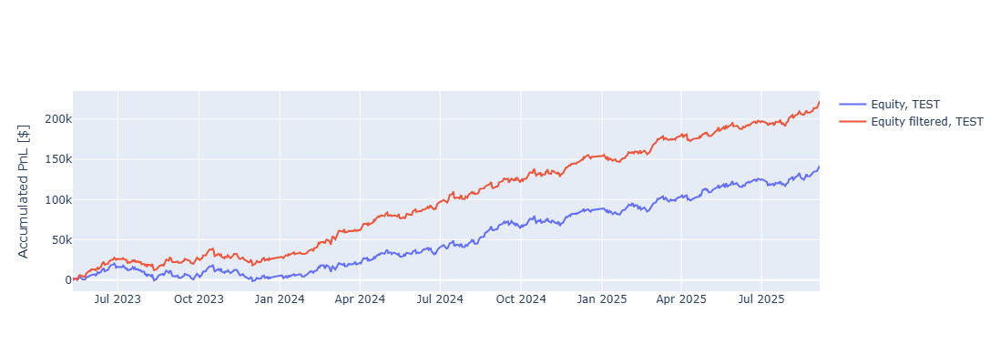

In [37]:
# --- Replace first values of composite signal by 3 (average, not high or low) ---
train_data.index = range(len(train_data))
test_data.index = range(len(test_data))

train_data.loc[0, 'composite_quintile'] = 3
train_data.loc[1, 'composite_quintile'] = 3
test_data.loc[0, 'composite_quintile'] = 3
test_data.loc[1, 'composite_quintile'] = 3

# --- Equity curve on Train data ---
train_data['equity'] = train_data['total_pnl'].cumsum()

train_data['position'] = (1 + train_data['composite_quintile']) / 4
train_data['equity_filtered'] = (train_data['total_pnl'] * train_data['position']).cumsum()

# --- Equity curve on Test data ---
test_data['equity'] = test_data['total_pnl'].cumsum()

test_data['position'] = (1 + test_data['composite_quintile']) / 4
test_data['equity_filtered'] = (test_data['total_pnl'] * test_data['position']).cumsum()

# --- plot ---
fig = go.Figure()

# fig.add_trace(go.Scatter(x=train_data.date, y=train_data.equity, name='Equity, TRAIN'))
# fig.add_trace(go.Scatter(x=train_data.date, y=train_data.equity_filtered, name='Equity filtered, TRAIN'))
fig.add_trace(go.Scatter(x=test_data.date, y=test_data.equity, name='Equity, TEST'))
fig.add_trace(go.Scatter(x=test_data.date, y=test_data.equity_filtered, name='Equity filtered, TEST'))

fig.update_layout(width=1000, height=400, yaxis_title='Accumulated PnL [$]')

In [38]:
# --- Repeat for train data ---
n_years = (train_data.date.max() - train_data.date.min()).days / 365
annualized_return = (train_data['equity'].values[-1] - train_data['equity'].values[0]) / n_years
annualized_vol = train_data['equity'].diff().std() * np.sqrt(252)
maxdd = (train_data['equity'].cummax() - train_data['equity']).max()
sharpe = annualized_return / annualized_vol
calmar = annualized_return / maxdd

annualized_return_filt = (train_data['equity_filtered'].values[-1] - train_data['equity_filtered'].values[0]) / n_years
annualized_vol_filt = train_data['equity_filtered'].diff().std() * np.sqrt(252)
maxdd_filt = (train_data['equity_filtered'].cummax() - train_data['equity_filtered']).max()
sharpe_filt = annualized_return_filt / annualized_vol_filt
calmar_filt = annualized_return_filt / maxdd_filt

print('Train data, equity')
print('-----------------------------------')
print(f'Annualized return:     {int(annualized_return/1000)} k$')
print(f'Annualized vol:        {int(annualized_vol/1000)} k$')
print(f'Maximum drawdown:      {int(maxdd/1000)} k$')
print(f'Sharpe ratio:          {round(sharpe, 2)}')
print(f'Calmar ratio:          {round(calmar, 2)}')

print('\nTrain data, equity filtered by signal')
print('-----------------------------------')
print(f'Annualized return:     {int(annualized_return_filt/1000)} k$')
print(f'Annualized vol:        {int(annualized_vol_filt/1000)} k$')
print(f'Maximum drawdown:      {int(maxdd_filt/1000)} k$')
print(f'Sharpe ratio:          {round(sharpe_filt, 2)}')
print(f'Calmar ratio:          {round(calmar_filt, 2)}')

# --- Repeat for test data ---
n_years = (test_data.date.max() - test_data.date.min()).days / 365
annualized_return = (test_data['equity'].values[-1] - test_data['equity'].values[0]) / n_years
annualized_vol = test_data['equity'].diff().std() * np.sqrt(252)
maxdd = (test_data['equity'].cummax() - test_data['equity']).max()
sharpe = annualized_return / annualized_vol
calmar = annualized_return / maxdd

annualized_return_filt = (test_data['equity_filtered'].values[-1] - test_data['equity_filtered'].values[0]) / n_years
annualized_vol_filt = test_data['equity_filtered'].diff().std() * np.sqrt(252)
maxdd_filt = (test_data['equity_filtered'].cummax() - test_data['equity_filtered']).max()
sharpe_filt = annualized_return_filt / annualized_vol_filt
calmar_filt = annualized_return_filt / maxdd_filt

print('\n\nTest data, original equity')
print('-----------------------------------')
print(f'Annualized return:     {int(annualized_return/1000)} k$')
print(f'Annualized vol:        {int(annualized_vol/1000)} k$')
print(f'Maximum drawdown:      {int(maxdd/1000)} k$')
print(f'Sharpe ratio:          {round(sharpe, 2)}')
print(f'Calmar ratio:          {round(calmar, 2)}')

print('\nTest data, equity filtered by signal')
print('-----------------------------------')
print(f'Annualized return:     {int(annualized_return_filt/1000)} k$')
print(f'Annualized vol:        {int(annualized_vol_filt/1000)} k$')
print(f'Maximum drawdown:      {int(maxdd_filt/1000)} k$')
print(f'Sharpe ratio:          {round(sharpe_filt, 2)}')
print(f'Calmar ratio:          {round(calmar_filt, 2)}')

Train data, equity
-----------------------------------
Annualized return:     57 k$
Annualized vol:        32 k$
Maximum drawdown:      22 k$
Sharpe ratio:          1.77
Calmar ratio:          2.53

Train data, equity filtered by signal
-----------------------------------
Annualized return:     108 k$
Annualized vol:        34 k$
Maximum drawdown:      20 k$
Sharpe ratio:          3.13
Calmar ratio:          5.35


Test data, original equity
-----------------------------------
Annualized return:     61 k$
Annualized vol:        33 k$
Maximum drawdown:      22 k$
Sharpe ratio:          1.83
Calmar ratio:          2.78

Test data, equity filtered by signal
-----------------------------------
Annualized return:     96 k$
Annualized vol:        34 k$
Maximum drawdown:      20 k$
Sharpe ratio:          2.79
Calmar ratio:          4.68


# <br><br> 9. Grid search, linear position size

In [111]:
# --- Calculate composite quintile for the entire dataset
data.index = range(len(data))
data['composite_quintile'] = data[[f'{metric}_quintile' for metric in best_metrics]].mean(axis=1)
data['composite_quintile'] = (cumulative_percentile(data['composite_quintile'], 1e10, False) // 20 + 1).clip(1,5)

# --- Initialize opt param columns ---
data["opt_param_0"] = np.nan
data["opt_param_1"] = np.nan

# --- Forward Walk Optimization ----
train_window = 18 * 21 # 18 months for training
test_window = 3 * 21 # 3 months for testing

min_size_array = np.linspace(0,1,10)
max_size_array = np.linspace(1,3,10)

_from = 0
while True:
    _to = _from + train_window

    if _to >= len(data):
        break
    
    data_train = data.iloc[_from:_to]
    data_test = data.iloc[_to:_to+test_window]

    # debug: verificar que las ventanas cambian
    print(f"train={data_train.index.min()}-{data_train.index.max()} "
          f"test={data_test.index.min()}-{data_test.index.max()}")

    sharpe_results = []
    for MIN_SIZE in min_size_array:
        for MAX_SIZE in max_size_array:
            size = MIN_SIZE + (data_train['composite_quintile'] - 1) / 4 * (MAX_SIZE - MIN_SIZE)
            equity = (size * data_train['total_pnl']).cumsum()

            n_years = (data_train.date.max() - data_train.date.min()).days / 365
            annualized_return = (equity.iloc[-1] - equity.iloc[0]) / n_years
            annualized_vol = equity.diff().std() * np.sqrt(252)

            sharpe = annualized_return / annualized_vol if annualized_vol > 0 else np.nan
            sharpe_results.append((MIN_SIZE, MAX_SIZE, sharpe))

    results_df = pd.DataFrame(sharpe_results, columns=["param_0", "param_1", "sharpe"])

    # --- Instead of taking best params, we calculate median of top 5% (this is more robust) ---
    n = int(0.05*len(sharpe_results))
    opt_param_0 = [np.median(results_df.sort_values('sharpe', ascending=False)['param_0'].values[:n])] * len(data_test)
    opt_param_1 = [np.median(results_df.sort_values('sharpe', ascending=False)['param_1'].values[:n])] * len(data_test)
    # opt_param_0 = [results_df.sort_values('sharpe', ascending=False)['param_0'].values[0]] * len(data_test)
    # opt_param_1 = [results_df.sort_values('sharpe', ascending=False)['param_1'].values[0]] * len(data_test)

    # aplicar solo a test
    data.loc[data_test.index, "opt_param_0"] = opt_param_0.copy()
    data.loc[data_test.index, "opt_param_1"] = opt_param_1.copy()

    _from += test_window

train=0-377 test=378-440
train=63-440 test=441-503
train=126-503 test=504-566
train=189-566 test=567-629
train=252-629 test=630-692
train=315-692 test=693-755
train=378-755 test=756-818
train=441-818 test=819-881
train=504-881 test=882-944
train=567-944 test=945-1007
train=630-1007 test=1008-1070
train=693-1070 test=1071-1084


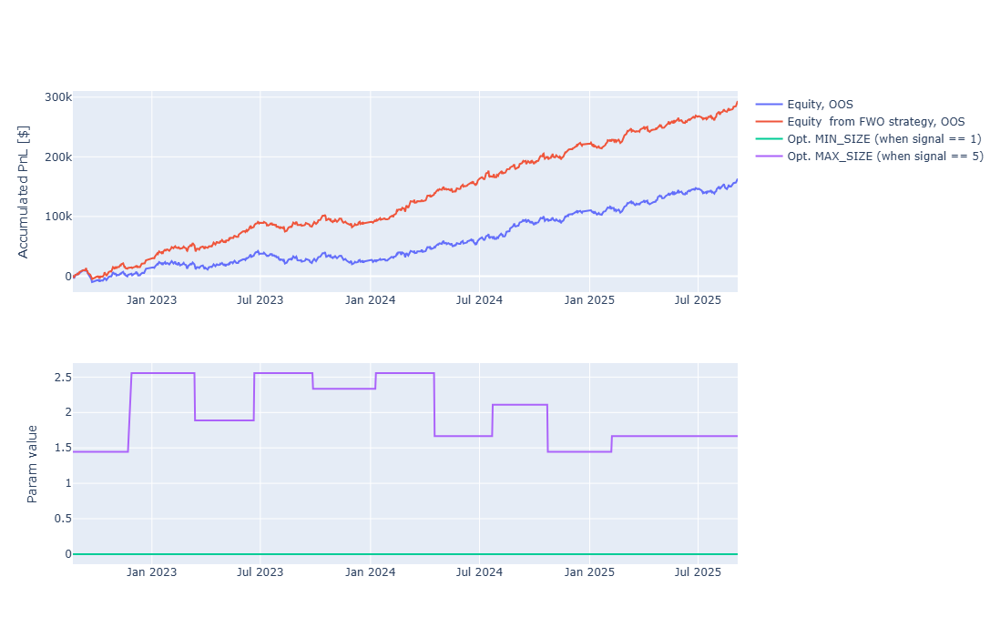

In [118]:
# --- We take OOS, only rows that we have calculated opt params from FWO ---
oos_data = data.dropna(subset=['opt_param_0'])

# --- Equity curve on Train data ---
oos_data['equity'] = oos_data['total_pnl'].cumsum()

oos_data['position'] = oos_data['opt_param_0'] + (oos_data['composite_quintile'] - 1) / 4 * (oos_data['opt_param_1'] - oos_data['opt_param_0'])
oos_data['position'] = (1 + oos_data['composite_quintile']) / 4
oos_data['equity_fwo_strategy'] = (oos_data['total_pnl'] * oos_data['position']).cumsum()

# --- Equity curve of original strategy ---
oos_data['equity'] = oos_data['total_pnl'].cumsum()

# --- plot ---
fig = make_subplots(rows=2, cols=1)

fig.add_trace(go.Scatter(x=oos_data.date, y=oos_data.equity, name='Equity, OOS'))
fig.add_trace(go.Scatter(x=oos_data.date, y=oos_data.equity_fwo_strategy, name='Equity  from FWO strategy, OOS'))

fig.add_trace(go.Scatter(x=oos_data.date, y=oos_data.opt_param_0, name='Opt. MIN_SIZE (when signal == 1)'), row=2, col=1)
fig.add_trace(go.Scatter(x=oos_data.date, y=oos_data.opt_param_1, name='Opt. MAX_SIZE (when signal == 5)'), row=2, col=1)

fig.update_layout(width=1000, height=700, yaxis_title='Accumulated PnL [$]', yaxis2_title='Param value')

In [120]:
# --- Repeat for test data ---
n_years = (oos_data.date.max() - oos_data.date.min()).days / 365
annualized_return = (oos_data['equity'].values[-1] - oos_data['equity'].values[0]) / n_years
annualized_vol = oos_data['equity'].diff().std() * np.sqrt(252)
maxdd = (oos_data['equity'].cummax() - oos_data['equity']).max()
sharpe = annualized_return / annualized_vol
calmar = annualized_return / maxdd

annualized_return_filt = (oos_data['equity_fwo_strategy'].values[-1] - oos_data['equity_fwo_strategy'].values[0]) / n_years
annualized_vol_filt = oos_data['equity_fwo_strategy'].diff().std() * np.sqrt(252)
maxdd_filt = (oos_data['equity_fwo_strategy'].cummax() - oos_data['equity_fwo_strategy']).max()
sharpe_filt = annualized_return_filt / annualized_vol_filt
calmar_filt = annualized_return_filt / maxdd_filt

print('OOS data, original equity')
print('-----------------------------------')
print(f'Annualized return:     {int(annualized_return/1000)} k$')
print(f'Annualized vol:        {int(annualized_vol/1000)} k$')
print(f'Maximum drawdown:      {int(maxdd/1000)} k$')
print(f'Sharpe ratio:          {round(sharpe, 2)}')
print(f'Calmar ratio:          {round(calmar, 2)}')

print('\nOOS data, equity from FWO strategy')
print('-----------------------------------')
print(f'Annualized return:     {int(annualized_return_filt/1000)} k$')
print(f'Annualized vol:        {int(annualized_vol_filt/1000)} k$')
print(f'Maximum drawdown:      {int(maxdd_filt/1000)} k$')
print(f'Sharpe ratio:          {round(sharpe_filt, 2)}')
print(f'Calmar ratio:          {round(calmar_filt, 2)}')

OOS data, original equity
-----------------------------------
Annualized return:     53 k$
Annualized vol:        33 k$
Maximum drawdown:      22 k$
Sharpe ratio:          1.57
Calmar ratio:          2.41

OOS data, equity from FWO strategy
-----------------------------------
Annualized return:     96 k$
Annualized vol:        36 k$
Maximum drawdown:      20 k$
Sharpe ratio:          2.64
Calmar ratio:          4.62


# <br><br> 10. Grid search, discrete weights

In [152]:
# --- Calculate composite quintile for the entire dataset
data.index = range(len(data))
data['composite_quintile'] = data[[f'{metric}_quintile' for metric in best_metrics]].mean(axis=1)
data['composite_quintile'] = (cumulative_percentile(data['composite_quintile'], 1e10, False) // 20 + 1).clip(1,5)

# --- Initialize opt param columns ---
data["opt_param_0"] = np.nan
data["opt_param_1"] = np.nan

# --- Forward Walk Optimization ----
train_window = 18 * 21 # 18 months for training
test_window = 3 * 21 # 3 months for testing

# --- All possible combinations of weights ---
import itertools

q1s = [0,0.25,0.5,0.75]
q2s = [0.5,0.75,1]
q3s = [1]
q4s = [1,1.25,1.5]
q5s = [1.25,1.5,1.75,2]

combos = np.array(list(itertools.product(q1s, q2s, q3s, q4s, q5s)))

# --- Delete combos where not strictly ascending size ---
mask = np.all(np.diff(combos, axis=1) >= 0, axis=1)
ascending_combos = combos[mask]

_from = 0
while True:
    _to = _from + train_window

    if _to >= len(data):
        break
    
    data_train = data.iloc[_from:_to]
    data_test = data.iloc[_to:_to+test_window]

    # debug: verificar que las ventanas cambian
    print(f"train={data_train.index.min()}-{data_train.index.max()} "
          f"test={data_test.index.min()}-{data_test.index.max()}")

    sharpe_results = []

    for combo in ascending_combos:
        # --- Mapping function ---
        mapping = {q: combo[q-1] for q in range(1, 6)}

        size = data_train['composite_quintile'].map(mapping)
        equity = (size * data_train['total_pnl']).cumsum()

        n_years = (data_train.date.max() - data_train.date.min()).days / 365
        annualized_return = (equity.iloc[-1] - equity.iloc[0]) / n_years
        annualized_vol = equity.diff().std() * np.sqrt(252)

        sharpe = annualized_return / annualized_vol if annualized_vol > 0 else np.nan
        sharpe_results.append((combo, sharpe))

    results_df = pd.DataFrame(sharpe_results, columns=["combo", "sharpe"])

    # --- We take combo with best results ---
    opt_combo = [list(results_df.sort_values('sharpe', ascending=False)['combo'].values[0])] * len(data_test)

    # aplicar solo a test
    data.loc[data_test.index, "opt_combo"] = pd.Series(opt_combo, index=data_test.index, dtype=object)

    _from += test_window

train=0-377 test=378-440
train=63-440 test=441-503
train=126-503 test=504-566
train=189-566 test=567-629
train=252-629 test=630-692
train=315-692 test=693-755
train=378-755 test=756-818
train=441-818 test=819-881
train=504-881 test=882-944
train=567-944 test=945-1007
train=630-1007 test=1008-1070
train=693-1070 test=1071-1084


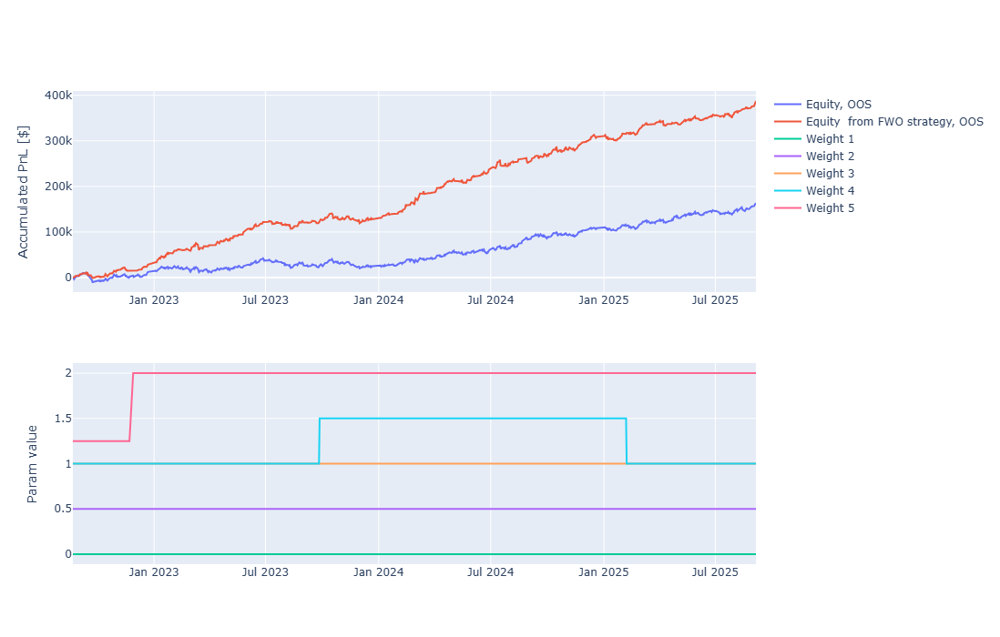

In [162]:
data['w1'] = data['opt_combo'].apply(lambda x: x[0] if type(x) == list else x)
data['w2'] = data['opt_combo'].apply(lambda x: x[1] if type(x) == list else x)
data['w3'] = data['opt_combo'].apply(lambda x: x[2] if type(x) == list else x)
data['w4'] = data['opt_combo'].apply(lambda x: x[3] if type(x) == list else x)
data['w5'] = data['opt_combo'].apply(lambda x: x[4] if type(x) == list else x)

oos_data = data.dropna(subset=['w1'])

# --- Assign weight to every row, depending on composite quintile signal ---
oos_data['size'] = 1
for i, row in oos_data.iterrows():
    signal = int(row['composite_quintile'])
    oos_data.loc[i, 'size'] = row[f'w{signal}']

# --- Equity curve on OOS ---
oos_data['equity'] = oos_data['total_pnl'].cumsum()

oos_data['position'] = oos_data['size']
oos_data['equity_fwo_strategy'] = (oos_data['total_pnl'] * oos_data['position']).cumsum()

# --- Equity curve of original strategy ---
oos_data['equity'] = oos_data['total_pnl'].cumsum()

# --- plot ---
fig = make_subplots(rows=2, cols=1)

fig.add_trace(go.Scatter(x=oos_data.date, y=oos_data.equity, name='Equity, OOS'))
fig.add_trace(go.Scatter(x=oos_data.date, y=oos_data.equity_fwo_strategy, name='Equity  from FWO strategy, OOS'))

for i in range(1,6):
    fig.add_trace(go.Scatter(x=oos_data.date, y=oos_data[f'w{i}'], name=f'Weight {i}'), row=2, col=1)

fig.update_layout(width=1000, height=700, yaxis_title='Accumulated PnL [$]', yaxis2_title='Param value')
fig.show()

In [163]:
# --- Repeat for test data ---
n_years = (oos_data.date.max() - oos_data.date.min()).days / 365
annualized_return = (oos_data['equity'].values[-1] - oos_data['equity'].values[0]) / n_years
annualized_vol = oos_data['equity'].diff().std() * np.sqrt(252)
maxdd = (oos_data['equity'].cummax() - oos_data['equity']).max()
sharpe = annualized_return / annualized_vol
calmar = annualized_return / maxdd

annualized_return_filt = (oos_data['equity_fwo_strategy'].values[-1] - oos_data['equity_fwo_strategy'].values[0]) / n_years
annualized_vol_filt = oos_data['equity_fwo_strategy'].diff().std() * np.sqrt(252)
maxdd_filt = (oos_data['equity_fwo_strategy'].cummax() - oos_data['equity_fwo_strategy']).max()
sharpe_filt = annualized_return_filt / annualized_vol_filt
calmar_filt = annualized_return_filt / maxdd_filt

print('OOS data, original equity')
print('-----------------------------------')
print(f'Annualized return:     {int(annualized_return/1000)} k$')
print(f'Annualized vol:        {int(annualized_vol/1000)} k$')
print(f'Maximum drawdown:      {int(maxdd/1000)} k$')
print(f'Sharpe ratio:          {round(sharpe, 2)}')
print(f'Calmar ratio:          {round(calmar, 2)}')

print('\nOOS data, equity from FWO strategy')
print('-----------------------------------')
print(f'Annualized return:     {int(annualized_return_filt/1000)} k$')
print(f'Annualized vol:        {int(annualized_vol_filt/1000)} k$')
print(f'Maximum drawdown:      {int(maxdd_filt/1000)} k$')
print(f'Sharpe ratio:          {round(sharpe_filt, 2)}')
print(f'Calmar ratio:          {round(calmar_filt, 2)}')

OOS data, original equity
-----------------------------------
Annualized return:     53 k$
Annualized vol:        33 k$
Maximum drawdown:      22 k$
Sharpe ratio:          1.57
Calmar ratio:          2.41

OOS data, equity from FWO strategy
-----------------------------------
Annualized return:     127 k$
Annualized vol:        39 k$
Maximum drawdown:      21 k$
Sharpe ratio:          3.22
Calmar ratio:          5.97
